<a href="https://colab.research.google.com/github/pankajrawat9075/Vehicle-counting-and-tracking-using-YOLOv8-and-bytetrack/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
!pip install ultralytics

Import required libraries

In [2]:
import cv2
from ultralytics import YOLO
from ultralytics.solutions import object_counter

from google.colab.patches import cv2_imshow

Import YOLO model and load video


In [5]:
# will be importing YOLO medium version for better accuracies
model = YOLO("yolov8m.pt")

cap = cv2.VideoCapture("/content/vehicle-counting.mp4")
assert cap.isOpened(), "Error reading video file"

Visualize the video frames

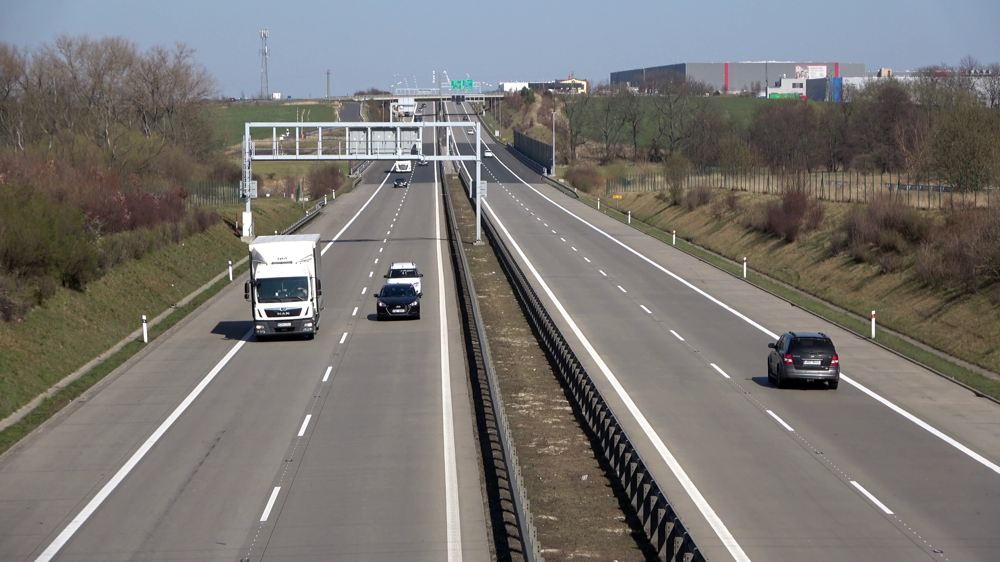


WARNING ⚠️ NMS time limit 0.550s exceeded
0: 384x640 4 cars, 1 truck, 128.7ms
Speed: 12.7ms preprocess, 128.7ms inference, 680.4ms postprocess per image at shape (1, 3, 384, 640)


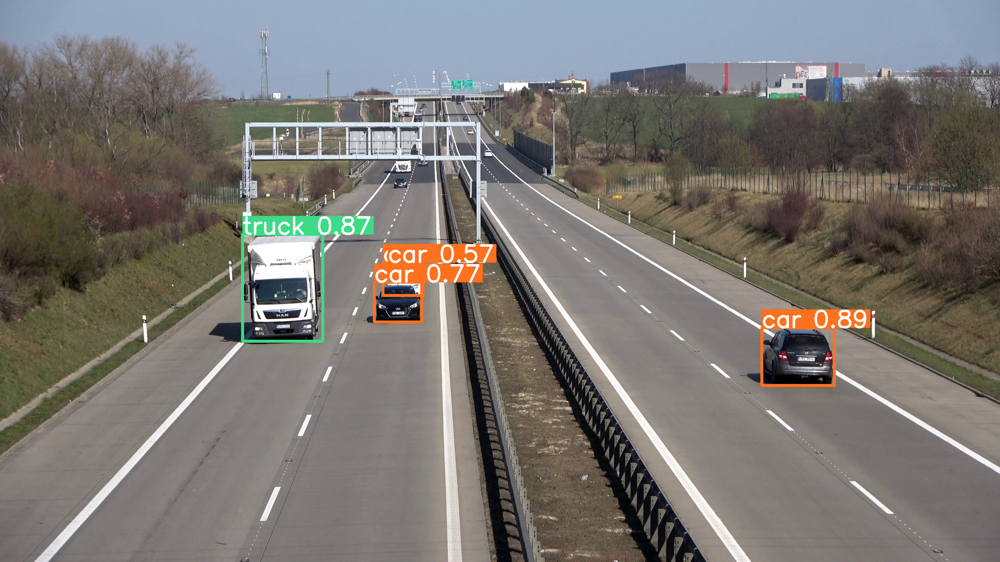

In [4]:
# check first frame
img = cv2_imshow(cap.read()[1])

# show results from yolo
results = model.predict(cap.read()[1])
cv2_imshow(results[0].plot())

Define parameters for object tracking

In [6]:
# get width, height and frames_per_second of the video
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))

print("Features of Video")
print(f" width : {w}\n height : {h}\n frames per second : {fps}")

# Define tracing points
line_points = [(3840, 1200),(20, 1200) ]

Features of Video
 width : 3840
 height : 2160
 frames per second : 25


Initialize a video writer object to save the tracked output

In [7]:
video_writer = cv2.VideoWriter("object_counting_output.avi",
                       cv2.VideoWriter_fourcc(*'mp4v'),
                       fps,
                       (w, h))

Initialize a Object Counter object for traking and counting

In [ ]:
# Init Object Counter
counter = object_counter.ObjectCounter()
counter.set_args(view_img=True,
                 reg_pts=line_points,
                 classes_names=model.names,
                 draw_tracks=True)

In [37]:
model = model.to('cuda')

Run the tracker frame by frame and save result

In [38]:
i = 0
while cap.isOpened() and i == 0:
    success, im0 = cap.read()
    if not success:
        print("Video frame is empty or video processing has been successfully completed.")
        break
    tracks = model.track(im0, persist=True, show=False)

    im0 = counter.start_counting(im0, tracks)
    video_writer.write(im0)

cap.release()
video_writer.release()
cv2.destroyAllWindows()

requirements: Ultralytics requirement ['lapx>=0.5.2'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 9.9 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 6.2s, installed 1 package: ['lapx>=0.5.2']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


WARNING ⚠️ NMS time limit 0.550s exceeded
0: 384x640 2 cars, 1 truck, 122.6ms
Speed: 13.7ms preprocess, 122.6ms inference, 666.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cars, 1 truck, 25.3ms
Speed: 4.4ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cars, 1 truck, 25.3ms
Speed: 4.0ms preprocess, 25.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cars, 1 truck, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cars, 1 truck, 25.3ms
Speed: 4.0ms preprocess, 25.3ms inference, 1.8ms postprocess